# 📄 Passport Reader - Visualization Notebook

Notebook này hiển thị toàn bộ quá trình xử lý ảnh passport/CCCD với các visualization đẹp mắt.

## 🚀 Cách sử dụng:
1. Chạy tất cả cells theo thứ tự
2. Xem các ảnh visualization được tạo ra
3. Kiểm tra kết quả trích xuất thông tin


In [1]:
# Import các thư viện cần thiết
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pytesseract
from src.text_extraction import extract_text_from_roi
from src.image_processing import preprocess_image, extract_roi, scan_document1
from src.mrz_parser import parse_mrz
from src.data_normalization import correct_place_of_birth, compare_names
from src.config import ROIS, MRZ_ROI, CCCD_ROIS

# Set đường dẫn Tesseract cho Windows
if os.name == 'nt':
    pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
    os.environ['TESSDATA_PREFIX'] = r'C:\Program Files\Tesseract-OCR\tessdata'

print("✅ Đã import tất cả thư viện cần thiết!")


✅ Đã import tất cả thư viện cần thiết!


In [2]:
# Cấu hình matplotlib để hiển thị đẹp hơn
plt.rcParams['figure.figsize'] = (20, 12)
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.labelsize'] = 14

print("🎨 Đã cấu hình matplotlib!")


🎨 Đã cấu hình matplotlib!


In [3]:
# Hàm phát hiện loại tài liệu
def detect_document_type(image):
    """Phát hiện loại tài liệu: CCCD hoặc Passport"""
    text = extract_text_from_roi(image)
    if "CĂN CƯỚC CÔNG DÂN" in text.upper():
        return "CCCD"
    
    try:
        parse_mrz(image, MRZ_ROI)
        return "PASSPORT"
    except:
        return "CCCD"

# Hàm hiển thị ROI detection
def visualize_roi_detection(image, rois, title="ROI Detection", save_path=None):
    """Hiển thị các vùng ROI được phát hiện"""
    image_copy = image.copy()
    
    # Vẽ các vùng ROI
    colors = [(0, 0, 255), (0, 255, 0), (255, 0, 0), (0, 255, 255), (255, 0, 255)]
    for i, roi in enumerate(rois, 1):
        x, y, w, h = roi
        color = colors[(i-1) % len(colors)]
        cv2.rectangle(image_copy, (x, y), (x + w, y + h), color, 3)
        cv2.putText(image_copy, f"ROI {i}", (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, color, 2)
    
    # Chuyển đổi màu từ BGR sang RGB cho matplotlib
    image_rgb = cv2.cvtColor(image_copy, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(image_rgb)
    plt.title(title, fontsize=18, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()

print("🔍 Đã định nghĩa các hàm visualization!")


🔍 Đã định nghĩa các hàm visualization!


In [4]:
# Hàm hiển thị feature matching
def visualize_feature_matching(ref_image, scan_image, title="Feature Matching", save_path=None):
    """Hiển thị feature matching giữa 2 ảnh"""
    # Detect ORB features
    orb = cv2.ORB_create(nfeatures=1000)
    kp1, des1 = orb.detectAndCompute(ref_image, None)
    kp2, des2 = orb.detectAndCompute(scan_image, None)
    
    # Match features
    matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
    matches = matcher.match(des1, des2, None)
    matches = sorted(matches, key=lambda x: x.distance)
    
    # Draw matches
    good_matches = matches[:50]  # Top 50 matches
    img_matches = cv2.drawMatches(ref_image, kp1, scan_image, kp2, good_matches, None)
    img_matches_rgb = cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(20, 10))
    plt.imshow(img_matches_rgb)
    plt.title(title, fontsize=18, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()

# Hàm hiển thị các bước xử lý
def visualize_processing_steps(original, processed, title="Processing Steps", save_path=None):
    """Hiển thị các bước xử lý"""
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    processed_rgb = cv2.cvtColor(processed, cv2.COLOR_BGR2RGB)
    
    plt.figure(figsize=(20, 10))
    
    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title("Original Image", fontsize=16, fontweight='bold')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(processed_rgb)
    plt.title("Processed Image", fontsize=16, fontweight='bold')
    plt.axis('off')
    
    plt.suptitle(title, fontsize=20, fontweight='bold')
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
    
    plt.show()

print("🔗 Đã định nghĩa các hàm hiển thị feature matching và processing!")


🔗 Đã định nghĩa các hàm hiển thị feature matching và processing!


In [5]:
# Hàm hiển thị kết quả trích xuất
def visualize_extraction_results(roi_images, extracted_texts, title="Extraction Results"):
    """Hiển thị kết quả trích xuất từ các ROI"""
    n_rois = len(roi_images)
    cols = 2
    rows = (n_rois + 1) // 2
    
    plt.figure(figsize=(20, 6 * rows))
    
    for i, (roi_img, text) in enumerate(zip(roi_images, extracted_texts), 1):
        plt.subplot(rows, cols, i)
        roi_rgb = cv2.cvtColor(roi_img, cv2.COLOR_BGR2RGB)
        plt.imshow(roi_rgb)
        plt.title(f"ROI {i}: {text[:50]}..." if len(text) > 50 else f"ROI {i}: {text}", 
                 fontsize=14, fontweight='bold')
        plt.axis('off')
    
    plt.suptitle(title, fontsize=20, fontweight='bold')
    plt.tight_layout()
    plt.show()

print("📝 Đã định nghĩa hàm hiển thị kết quả trích xuất!")


📝 Đã định nghĩa hàm hiển thị kết quả trích xuất!


## 🚀 Bắt đầu xử lý ảnh


In [6]:
# Đọc ảnh input
image_path = "input.jpg"
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print(f"📷 Đã đọc ảnh: {image_path}")
print(f"📏 Kích thước ảnh: {image.shape}")

# Hiển thị ảnh gốc
plt.figure(figsize=(12, 8))
plt.imshow(image_rgb)
plt.title("Ảnh Input Gốc", fontsize=18, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()


error: OpenCV(4.11.0) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


In [ ]:
# Phát hiện loại tài liệu
doc_type = detect_document_type(image)
print(f"🔍 Loại tài liệu phát hiện: {doc_type}")

if doc_type == "CCCD":
    print("📋 Đây là Căn cước công dân (CCCD)")
    rois = CCCD_ROIS
    template_path = "template/CCCD.png"
else:\
    print("📘 Đây là Hộ chiếu (Passport)")
    rois = ROIS
    template_path = "template/ho_chieu.jpg"


NameError: name 'cv2' is not defined

: 

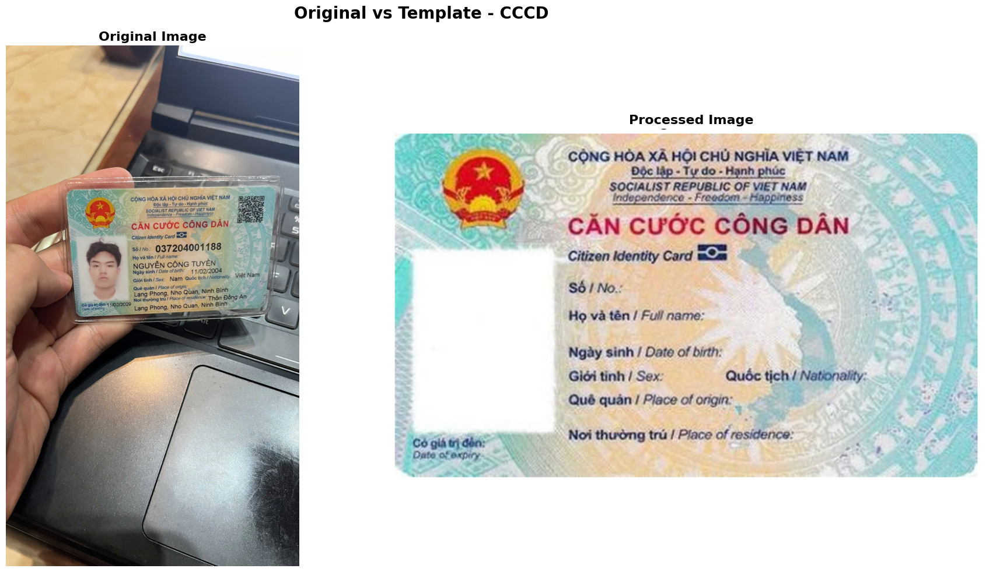

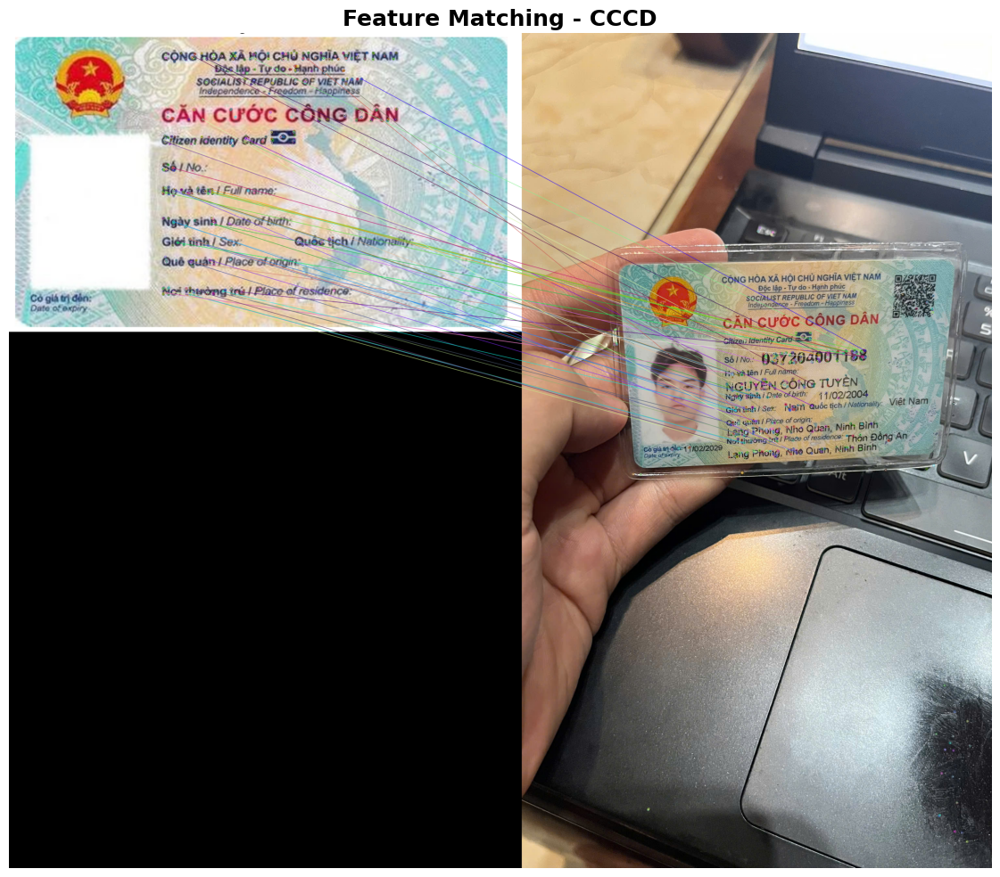

📐 Đang căn chỉnh ảnh...


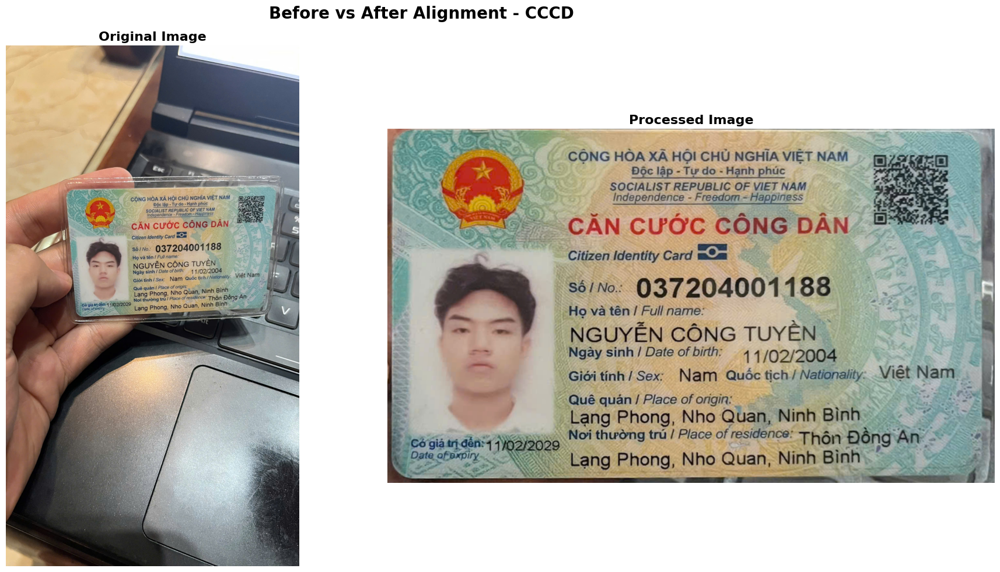

✅ Đã căn chỉnh ảnh thành công!


In [ ]:
# Đọc template và hiển thị so sánh
template = cv2.imread(template_path)
if template is not None:
    template_rgb = cv2.cvtColor(template, cv2.COLOR_BGR2RGB)
    
    # Hiển thị Original vs Template
    visualize_processing_steps(image, template, 
                              f"Original vs Template - {doc_type}",
                              f"original_vs_template_{doc_type.lower()}.jpg")
    
    # Hiển thị Feature Matching
    visualize_feature_matching(template, image, 
                              f"Feature Matching - {doc_type}",
                              f"feature_matching_{doc_type.lower()}.jpg")
    
    # Căn chỉnh ảnh
    print("📐 Đang căn chỉnh ảnh...")
    aligned_image = scan_document1(template, image)
    cv2.imwrite("after_scan.jpg", aligned_image)
    
    # Hiển thị trước và sau căn chỉnh
    visualize_processing_steps(image, aligned_image, 
                              f"Before vs After Alignment - {doc_type}",
                              f"before_after_alignment_{doc_type.lower()}.jpg")
    
    image = aligned_image
    print("✅ Đã căn chỉnh ảnh thành công!")
else:
    print(f"⚠️ Không tìm thấy template: {template_path}")


🎯 Phát hiện các vùng ROI...


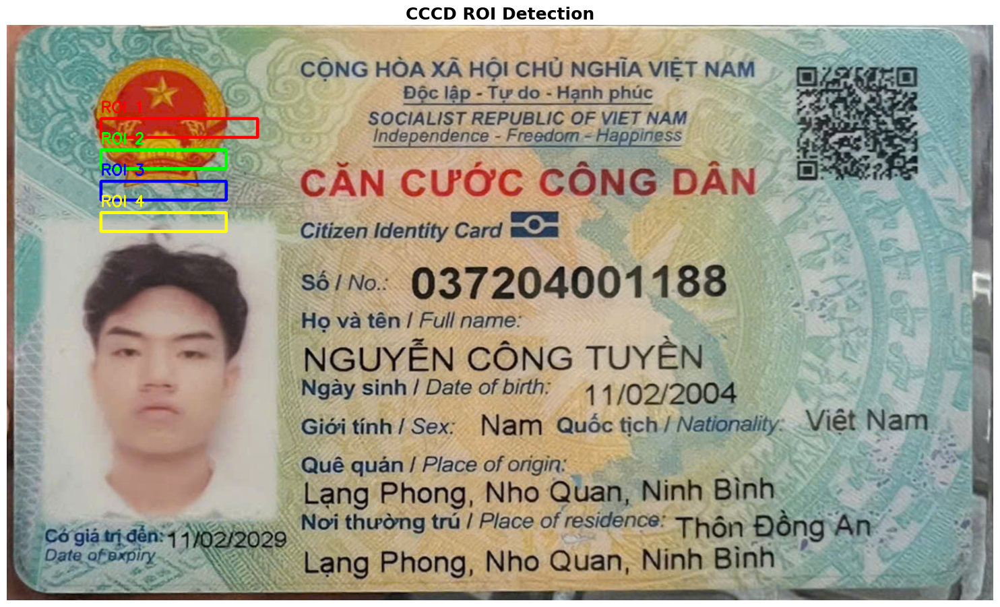

📍 Đã phát hiện 4 vùng ROI


In [ ]:
# Hiển thị ROI Detection
print("🎯 Phát hiện các vùng ROI...")
visualize_roi_detection(image, rois, 
                       f"{doc_type} ROI Detection",
                       f"{doc_type.lower()}_roi_detection.jpg")

print(f"📍 Đã phát hiện {len(rois)} vùng ROI")


⚙️ Đang xử lý ảnh...


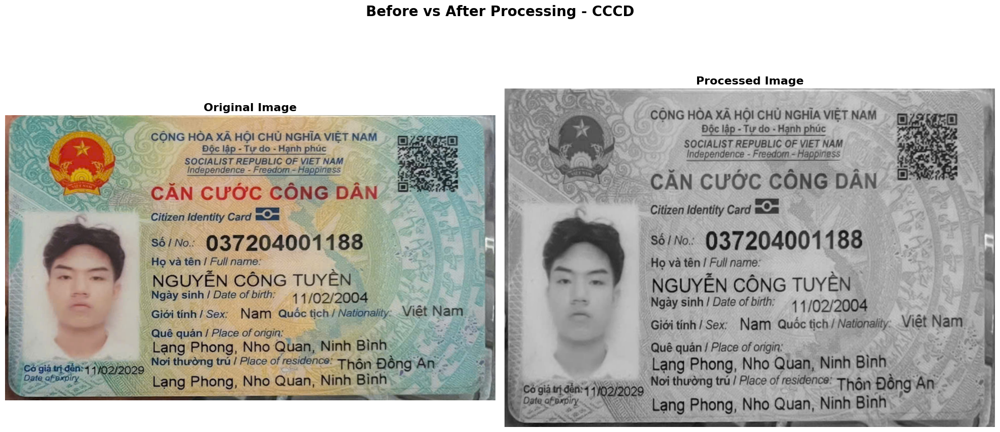

✅ Đã xử lý ảnh thành công!


In [ ]:
# Xử lý ảnh và trích xuất thông tin
print("⚙️ Đang xử lý ảnh...")
preprocessed_img = preprocess_image(image)
cv2.imwrite("temp_processed.jpg", preprocessed_img)

# Hiển thị trước và sau xử lý
visualize_processing_steps(image, preprocessed_img, 
                          f"Before vs After Processing - {doc_type}",
                          f"before_after_processing_{doc_type.lower()}.jpg")

print("✅ Đã xử lý ảnh thành công!")


In [ ]:
# Trích xuất thông tin từ các ROI
print("📝 Trích xuất thông tin từ các vùng ROI...")

roi_images = []
extracted_texts = []
extracted_info = {}

for i, roi in enumerate(rois, 1):
    roi_image = extract_roi(image, roi)
    output_path = f"roi_{i}.jpg"
    cv2.imwrite(output_path, roi_image)
    
    extracted_text = extract_text_from_roi(roi_image)
    roi_images.append(roi_image)
    extracted_texts.append(extracted_text)
    
    print(f"  ROI {i}: {extracted_text}")
    
    # Lưu thông tin theo loại tài liệu
    if doc_type == "CCCD":
        if i == 1:
            extracted_info['Họ và tên'] = extracted_text
        elif i == 2:
            extracted_info['Ngày sinh'] = extracted_text
        elif i == 3:
            extracted_info['Nơi thường trú'] = extracted_text
        elif i == 4:
            extracted_info['Nơi đăng ký thường trú'] = extracted_text
    else:  # Passport
        if i == 1:
            extracted_info['Tên (tiếng Anh)'] = extracted_text
        elif i == 2:
            extracted_info['Nơi sinh'] = extracted_text
        elif i == 3:
            extracted_info['Nơi cấp'] = extracted_text
        elif i == 4:
            extracted_info['Tên (tiếng Anh)'] = extracted_text

print("✅ Đã trích xuất thông tin từ tất cả ROI!")


📝 Trích xuất thông tin từ các vùng ROI...
  ROI 1: _ˆ« xxx si xà %xx^* «Sẻ NGYX v : ' # ể
NV TAY Ñ: ÂÝ

5Š» 2
  ROI 2: `¬^¬`Ö

o và tên Ï Full namà: `

9,

//Yl“ˆ *2⁄“*éd ,
/ mm, v47)
-.W -—-« "

l£ MT.
£- 7 á
ˆ.c C †”—_. LÊ ¡ - “vu tpPBP/," - '« š

¬s=-
l4 Sx €
,*
2»
Z2A‹\
cw=

v
"
2
f

“2£
  ROI 3: “ Ngày Sinh / Dale Of bị; +

⁄Z ị 7
(9⁄7 (: l2 7/0 SH 1542⁄/, 2//AÁ4
  ROI 4: “q “ Quê quản ƒ Place Gƒ` 0t,
✅ Đã trích xuất thông tin từ tất cả ROI!


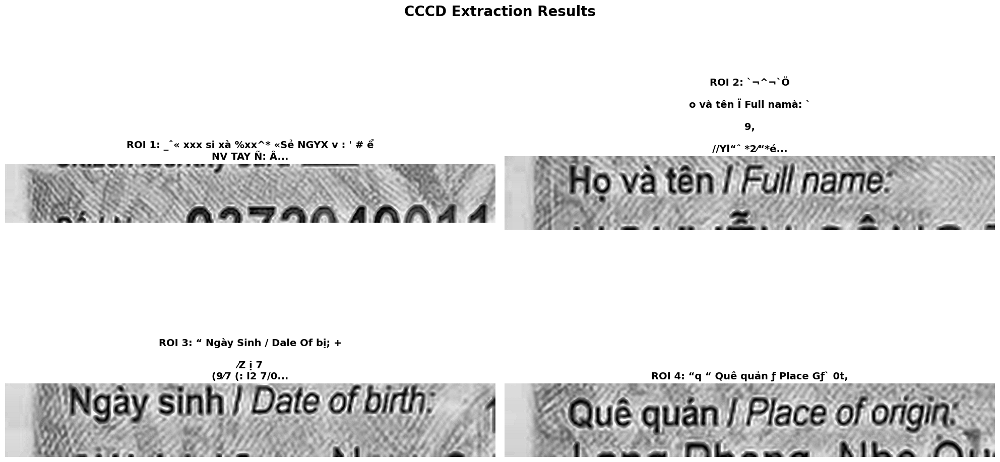

📊 Đã hiển thị kết quả trích xuất!


In [ ]:
# Hiển thị kết quả trích xuất
visualize_extraction_results(roi_images, extracted_texts, 
                           f"{doc_type} Extraction Results")

print("📊 Đã hiển thị kết quả trích xuất!")


In [ ]:
# Hiển thị thông tin cuối cùng
print(f"\n🎉 KẾT QUẢ CUỐI CÙNG - {doc_type}:")
print("=" * 50)
for key, value in extracted_info.items():
    if value.strip():  # Chỉ hiển thị nếu có giá trị
        print(f"  {key}: {value}")

print("\n📁 CÁC FILE ĐÃ TẠO:")
print("=" * 30)
print("  - roi_1.jpg, roi_2.jpg, roi_3.jpg, roi_4.jpg (các vùng ROI)")
print("  - after_scan.jpg (ảnh sau căn chỉnh)")
print("  - temp_processed.jpg (ảnh đã xử lý)")
print(f"  - original_vs_template_{doc_type.lower()}.jpg")
print(f"  - feature_matching_{doc_type.lower()}.jpg")
print(f"  - before_after_alignment_{doc_type.lower()}.jpg")
print(f"  - {doc_type.lower()}_roi_detection.jpg")
print(f"  - before_after_processing_{doc_type.lower()}.jpg")

print("\n✨ HOÀN THÀNH! Tất cả visualization đã được tạo ra!")



🎉 KẾT QUẢ CUỐI CÙNG - CCCD:
  Họ và tên: _ˆ« xxx si xà %xx^* «Sẻ NGYX v : ' # ể
NV TAY Ñ: ÂÝ

5Š» 2
  Ngày sinh: `¬^¬`Ö

o và tên Ï Full namà: `

9,

//Yl“ˆ *2⁄“*éd ,
/ mm, v47)
-.W -—-« "

l£ MT.
£- 7 á
ˆ.c C †”—_. LÊ ¡ - “vu tpPBP/," - '« š

¬s=-
l4 Sx €
,*
2»
Z2A‹\
cw=

v
"
2
f

“2£
  Nơi thường trú: “ Ngày Sinh / Dale Of bị; +

⁄Z ị 7
(9⁄7 (: l2 7/0 SH 1542⁄/, 2//AÁ4
  Nơi đăng ký thường trú: “q “ Quê quản ƒ Place Gƒ` 0t,

📁 CÁC FILE ĐÃ TẠO:
  - roi_1.jpg, roi_2.jpg, roi_3.jpg, roi_4.jpg (các vùng ROI)
  - after_scan.jpg (ảnh sau căn chỉnh)
  - temp_processed.jpg (ảnh đã xử lý)
  - original_vs_template_cccd.jpg
  - feature_matching_cccd.jpg
  - before_after_alignment_cccd.jpg
  - cccd_roi_detection.jpg
  - before_after_processing_cccd.jpg

✨ HOÀN THÀNH! Tất cả visualization đã được tạo ra!


: 

: 

## 🎯 Tóm tắt

Notebook này đã thực hiện:

1. **🔍 Phát hiện loại tài liệu** - CCCD hoặc Passport
2. **📐 Căn chỉnh ảnh** - Sử dụng feature matching
3. **🎯 Phát hiện ROI** - Các vùng cần trích xuất thông tin
4. **⚙️ Xử lý ảnh** - Cải thiện chất lượng
5. **📝 Trích xuất thông tin** - OCR từ các vùng ROI
6. **📊 Visualization** - Hiển thị toàn bộ quá trình

### 🚀 Cách sử dụng:
- Thay đổi `image_path` ở cell đầu tiên
- Chạy tất cả cells
- Xem kết quả và các file ảnh được tạo ra

### 📁 Files được tạo:
- Các ảnh ROI riêng lẻ
- Ảnh trước/sau xử lý
- Ảnh feature matching
- Ảnh ROI detection
- Kết quả cuối cùng
